## Advanced Lane Line Detection


This notebook provides a solution for lane line detection and tracking for self driving cars.  

The steps are:  

1. Camera Calibration
2. Distortion Correction
3. Gradient and Color Thresholding
4. Perspective Transform
5. Lane Line Search and Search Optimization
6. Drawing the lane overlay


In [1]:
import pickle
import io
import os
import glob
import functools
import collections
import numpy as np
import pandas as pd
import cv2 as cv
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import Image
from moviepy.editor import VideoFileClip
from IPython.display import HTML

from scipy import signal

%matplotlib inline

Environment preporation

In [2]:
#prepare
calibration_path = 'camera_cal'
calibration_glob = calibration_path + '/calibration*.jpg'

saved_img_path = 'saved_images'
corners_path = os.path.join(saved_img_path, 'corners') #path to save found corners sample images
corners_glob = corners_path + '/calibration*.jpg'

undistorted_path = os.path.join(saved_img_path, 'undistorted') #path to save undistorted sample images
undistorted_glob = undistorted_path + '/calibration*.jpg'

undistorted_test_glob = os.path.join(undistorted_path, 'calibration*.jpg')

test_images_path = 'test_images'
test_images_glob = test_images_path + '/test*.jpg'

tracking_path = os.path.join(saved_img_path, 'tracking') #path to save sample of tracking images

calibration_pickle_path = "calibration.pkl"

video_path = "video"
sample_video = 'project_video.mp4'
processed_video = os.path.join(video_path, 'processed_project_video.mp4')

if not os.path.exists(saved_img_path):  os.mkdir(saved_img_path)
if not os.path.exists(corners_path):  os.mkdir(corners_path)
if not os.path.exists(undistorted_path):  os.mkdir(undistorted_path)
if not os.path.exists(tracking_path):  os.mkdir(tracking_path)
    
if not os.path.exists(video_path): os.mkdir(video_path)


Help functions

In [3]:
def show_n_image_samples(n, image_paths, titles):
    i_slice = image_paths[:n]
    plt.figure()
    for i, p in enumerate(i_slice):
        f, (i1,i2) = plt.subplots(1 ,2, figsize=(20,10))
        fp,fn = os.path.split(p)
        cal_path = os.path.join(calibration_path, fn)
        cal_img = mpimg.imread(cal_path)
        processed_img = mpimg.imread(p)
        i1.imshow(cal_img)
        i1.set_title(titles[0], fontsize=20)
        i2.imshow(processed_img)
        i2.set_title(titles[1], fontsize=20)
          

In [4]:

def get_image_size(img):
    return img.shape[-2:-4:-1]

def load_image_size(image_path):
    img = mpimg.imread(image_path)
    return get_image_size(img)

def get_processed_img_path(image_path, target_dir):
    fp, fn = os.path.split(image_path)
    return os.path.join(target_dir, fn)


### Camera Calibration

In [5]:
# board is 6 rows by 9 columns, only inside points are used.
chess_rows = 6 
chess_columns = 9 

#get calibration images from path
calibration_images = glob.glob(calibration_glob)


In [6]:
ChessData = collections.namedtuple('ChessData', ['chess_points', 'image_points', 'image_size'])
CalibrationMatrix = collections.namedtuple('CalibrationMatrix', ['mtx', 'dist', 'image_size'])

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ...., (chess_columns,chess_rows,0)
chess_point = np.zeros((chess_columns * chess_rows, 3), np.float32)
chess_point[:, :2] = np.mgrid[0:chess_columns, 0:chess_rows].T.reshape(-1, 2)


In [7]:
def find_corners(img, chess_columns, chess_rows): 
    """ Find Chessboard Corners - returns result(bool) and coordinates """
    gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY) # convert to grayscale
    return cv.findChessboardCorners(gray, (chess_columns, chess_rows), None)

def save_corner_sample_image(image_path, image, ret, corners): 
    con_img_path = get_processed_img_path(image_path, corners_path)
    con_image = cv.drawChessboardCorners(image, (chess_columns, chess_rows), corners, ret)
    mpimg.imsave(con_img_path, con_image)

def find_and_save_corners(chess_data, image_path):
    """Load image, Find corners and save image with lines"""
    img = mpimg.imread(image_path)
    success, corners = find_corners(img, chess_columns, chess_rows)
    if success:
        chess_data.image_points.append(corners)
        chess_data.chess_points.append(chess_point)
        save_corner_sample_image(image_path, img, success, corners)
    else:
        print('corners were not found for image: {}'.format(image_path))
    return chess_data 
    
chess_data = functools.reduce(
                 find_and_save_corners, 
                 calibration_images, 
                 ChessData(chess_points=[], image_points=[], image_size=load_image_size(calibration_images[0])))


corners were not found for image: camera_cal/calibration5.jpg
corners were not found for image: camera_cal/calibration4.jpg
corners were not found for image: camera_cal/calibration1.jpg


<Figure size 432x288 with 0 Axes>

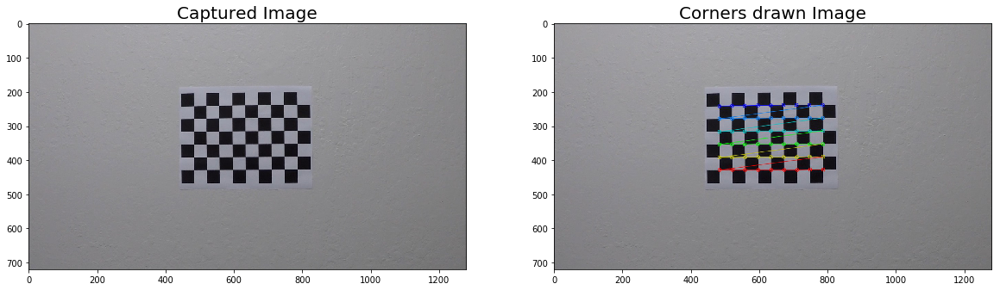

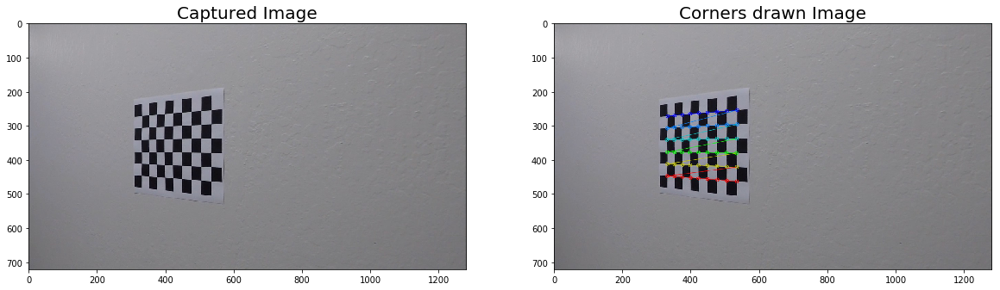

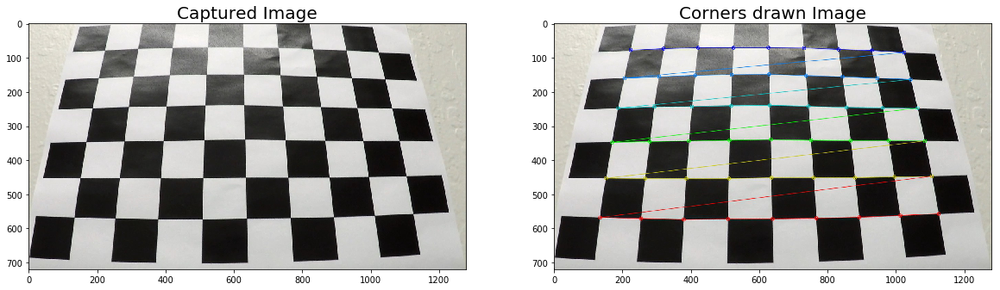

In [8]:
corner_image_paths = glob.glob(corners_glob)
#show 2 found corner samples
show_n_image_samples(3, corner_image_paths, ['Captured Image', 'Corners drawn Image'])


In [9]:
ret, mtx, dist, rvecs, tvecs = cv.calibrateCamera(
    chess_data.chess_points, 
    chess_data.image_points, 
    chess_data.image_size, 
    None, 
    None)

Store camera calibration to a file

In [10]:
#save calibration matrix
calibration_res = CalibrationMatrix(mtx = mtx, dist = dist, image_size = chess_data.image_size)
pickle.dump(calibration_res, open(calibration_pickle_path, "wb"))


### Distortion Correction

In [11]:
# load calibration data
camera_matrix = pickle.load(open(calibration_pickle_path, "rb" ))

In [12]:
def undistort(img, cl_matrix):
    img_size = get_image_size(img)
    return cv.undistort(img, cl_matrix.mtx, cl_matrix.dist, None, cl_matrix.mtx)

<Figure size 432x288 with 0 Axes>

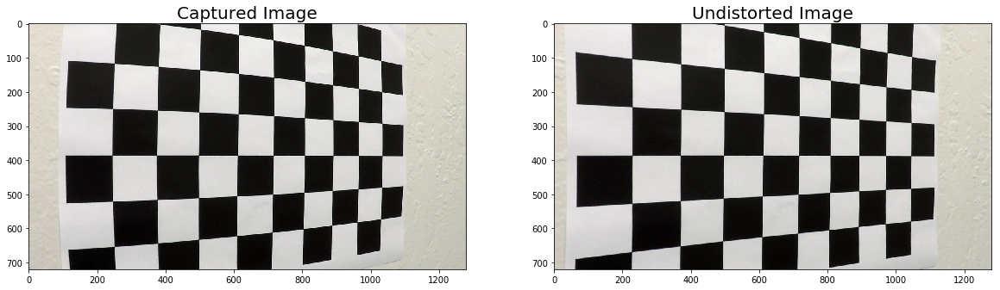

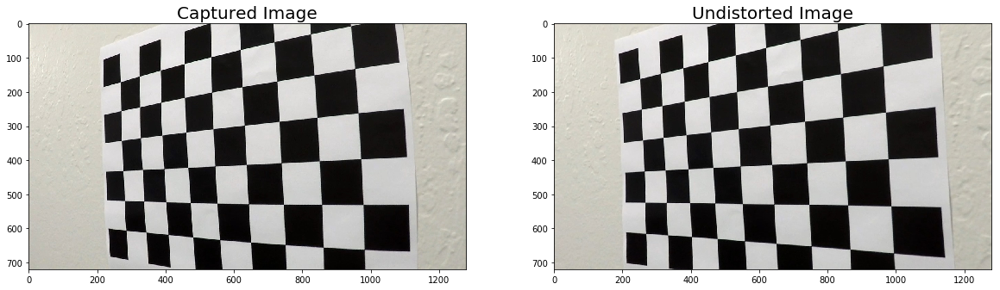

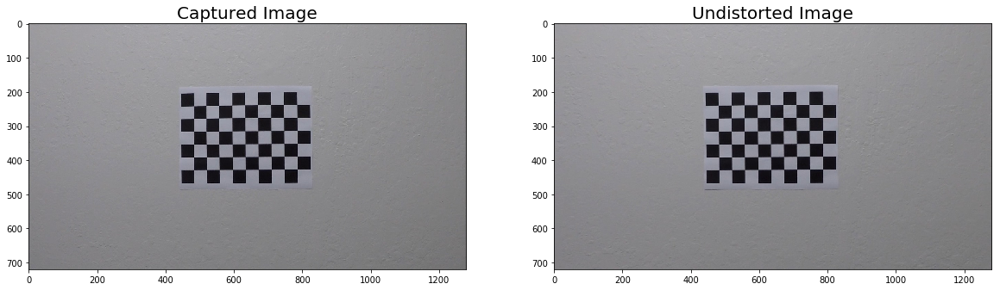

In [13]:
#undistort calibration images
def save_undistorted(image_path):
    img = mpimg.imread(image_path)
    undistorted_img = undistort(img, camera_matrix)
    undistorted_img_path = get_processed_img_path(image_path, undistorted_path)
    mpimg.imsave(undistorted_img_path, undistorted_img)

for i in corner_image_paths:
    fp, fn = os.path.split(i)
    cal_path = os.path.join(calibration_path, fn)
    save_undistorted(cal_path)   

#show 2 undistorted samples
show_n_image_samples(3, glob.glob(undistorted_glob), ['Captured Image', 'Undistorted Image'])       
        

In [14]:
def show_sample_fig(images, titles, cmaps, name=None ):
    plt.figure()
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()

    ax1.imshow(images[0], cmap=cmaps[0])
    ax1.set_title(titles[0], fontsize=20)
    ax2.imshow(images[1], cmap=cmaps[1])
    ax2.set_title(titles[1], fontsize=20)
    plt.tight_layout()
    if name:
        save_path = os.path.join(saved_img_path, name)
        plt.savefig(save_path)

Undistort a sample image

<Figure size 432x288 with 0 Axes>

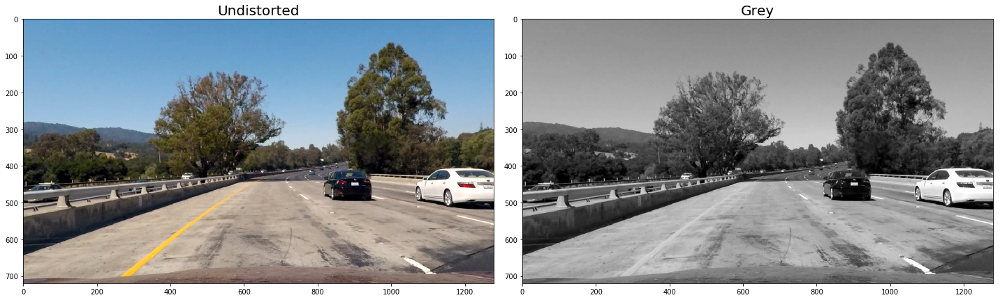

In [15]:
# undistort test image
test_image = mpimg.imread('test_images/test1.jpg')
test_image = undistort(test_image, camera_matrix)
grey_test_image = cv.cvtColor(test_image, cv.COLOR_RGB2GRAY)
show_sample_fig([test_image, grey_test_image], ['Undistorted', 'Grey'], [None, 'gray'], name='undistorted_sample.png')


### Gradient and Color Thresholding

In [16]:
# help functions
sobel_x = lambda img, ksize: cv.Sobel(img, cv.CV_64F, 1, 0, ksize=ksize)
sobel_y = lambda img, ksize: cv.Sobel(img, cv.CV_64F, 0, 1, ksize=ksize)

def sobel_xy(img, ksize, fn):
    x = sobel_x(img, ksize)
    y = sobel_y(img, ksize)
    return fn(x, y)

def threshold_fn(a, threshold, fn):
    res = np.zeros_like(a)
    res[fn(a,threshold)] = 1
    return res

exclusive_threshold = lambda a, t: threshold_fn(a, t, lambda a,t: (a > t[0]) & (a < t[1]))
inclusive_threshold = lambda a, t: threshold_fn(a, t, lambda a,t: (a >= t[0]) & (a <= t[1]))

to_eightbit = lambda a: np.uint8(255 * a / np.max(a))

#### Sobel gradients
Canny Edge Detection combines the sobel gradient for both x and y.  
By breaking it apart into its components, we can produced a refined version of Canny edge detection.

In [17]:
def sobel_filter(gray, threshold, sobel_fn):
    s = sobel_fn(gray, 3)
    s = np.absolute(s)
    return exclusive_threshold(to_eightbit(s), threshold) 

<Figure size 432x288 with 0 Axes>

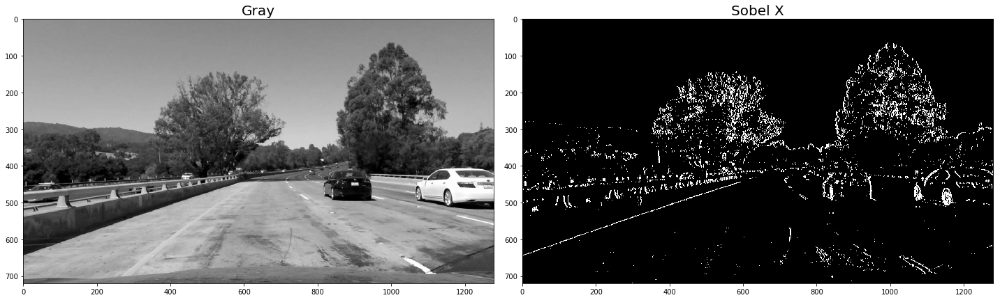

In [18]:
show_sample_fig([grey_test_image, sobel_filter(grey_test_image, (25, 200), sobel_x)], 
                ['Gray', 'Sobel X'],
                ['gray', 'gray'],
                name='sobel_x_sample.png')

<Figure size 432x288 with 0 Axes>

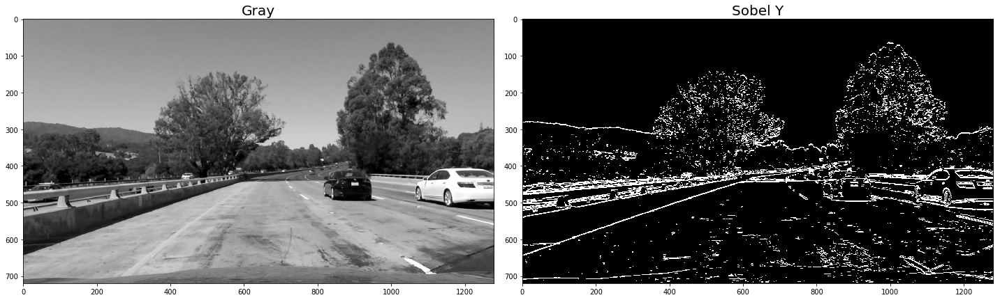

In [19]:
show_sample_fig([grey_test_image, sobel_filter(grey_test_image, (25, 200), sobel_y)], 
                ['Gray', 'Sobel Y'],
                ['gray', 'gray'],
                name='sobel_y_sample.png')

#### Gradient Magnitude
The function below will filter based on a min/max magnitude for the gradient.  
This function is looking at the combined xy gradient.

In [20]:
def magnitude_filter(gray, threshold, ksize):
    magnitude = sobel_xy(gray, ksize, lambda x, y: np.sqrt(x**2 + y**2))
    return exclusive_threshold(to_eightbit(magnitude), threshold)

<Figure size 432x288 with 0 Axes>

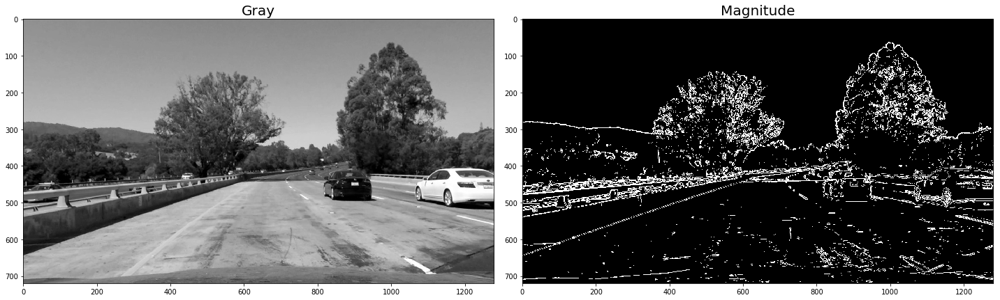

In [21]:
show_sample_fig([grey_test_image, magnitude_filter(grey_test_image, (30, 100), 3)], 
                ['Gray', 'Magnitude'],
                ['gray', 'gray'],
                name='magnitude_sample.png')

#### Gradient Direction
This function will filter based on the direction of the gradient.  
For lane detection, we will be interested in vertical lines that are +/- some threshold near $\frac{\pi}{2}$

In [22]:
def direction_filter(gray, threshold, ksize):
    direction = sobel_xy(gray, ksize, lambda x, y: np.arctan2(np.absolute(y), np.absolute(x)))
    return np.uint8(exclusive_threshold(direction, threshold))

<Figure size 432x288 with 0 Axes>

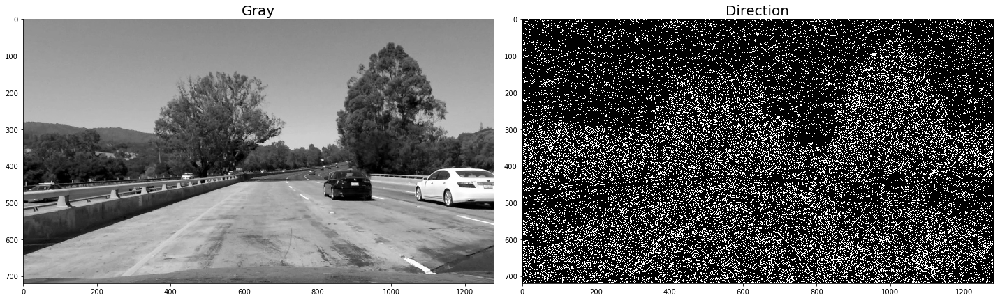

In [23]:
show_sample_fig([grey_test_image, direction_filter(grey_test_image, (0.8, 1.2), 3)], 
                ['Gray', 'Direction'],
                ['gray', 'gray'],
                name='direction_sample.png')

#### Saturation Channel
Lane lines are either yellow or white and we can use that fact.  
The Hue Saturation Lightness color space will help: the S channel of an HSL image retains a lot information   
about lane lines.

In [24]:
def hls_l_filter(hls_img, threshold):
    l = hls_img[:,:,1]
    return inclusive_threshold(l, threshold) 

def hls_s_filter(hls_img, threshold):
    s = hls_img[:,:,2]
    return inclusive_threshold(s, threshold) 


<Figure size 432x288 with 0 Axes>

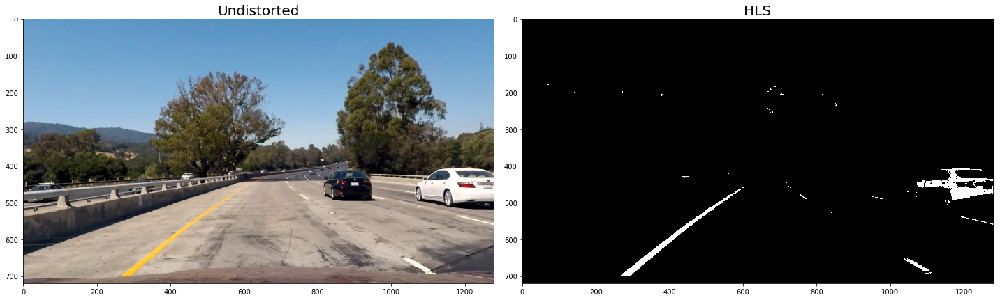

In [25]:
hls_test_image = cv.cvtColor(test_image, cv.COLOR_RGB2HLS)
show_sample_fig([test_image,
                 hls_l_filter(hls_test_image, (121, 255)) & hls_s_filter(hls_test_image, (140, 255)) ],
                ['Undistorted', 'HLS'],
                [None, 'gray'],
                name='hls_sample.png')

#### Combining Filter Methods
We can now mix different filter methods, each with unique threshold values.

In [26]:
def thresholding_filter(img):
    blured = cv.GaussianBlur(img, (3, 3), 0)
    gray = cv.cvtColor(blured, cv.COLOR_RGB2GRAY)
    hls_img = cv.cvtColor(blured, cv.COLOR_RGB2HLS)
    
    # sobel
    x_sobel = sobel_filter(gray, (25, 200), sobel_x)
    y_sobel = sobel_filter(gray, (25, 200), sobel_y)
    # magnitude
    magnitude = magnitude_filter(gray, (30, 100), 3)
    # direction
    direction = direction_filter(gray, (0.8, 1.2), 3)
    # color channels
    hls_l = hls_l_filter(hls_test_image, (121, 255)) 
    hls_s = hls_s_filter(hls_test_image, (140, 255))
    
    # white and yellow from RGB
    rgb_white = cv.inRange(blured, (200, 200, 200), (255, 255, 255))
    rgb_yellow = cv.inRange(blured, (20, 100, 100), (50, 255, 255))
    
    # white and yellow from HSV
    hsv = cv.cvtColor(blured, cv.COLOR_RGB2HSV)
    hsv_white = cv.inRange(hsv, (200, 200, 200), (255, 255, 255))
    hsv_yellow = cv.inRange(hsv, (20, 100, 100), (50, 255, 255))
    
    # mix
    return rgb_white | rgb_yellow | hsv_white | hsv_yellow | (hls_l & hls_s) | (x_sobel & y_sobel) | (magnitude & direction)


<Figure size 432x288 with 0 Axes>

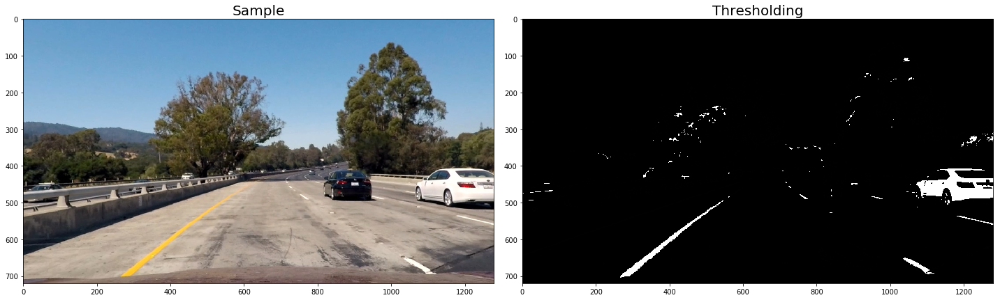

In [27]:
show_sample_fig([test_image, thresholding_filter(test_image)], 
                ['Sample', 'Thresholding'],
                [None, 'gray'],
                name='thresholding_sample.png')


Thresholding all test images 

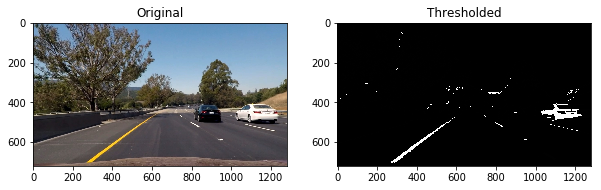

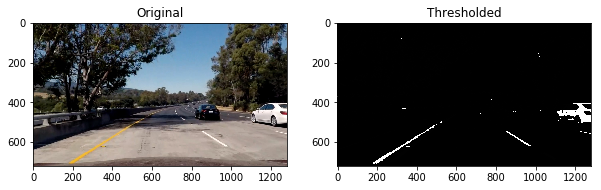

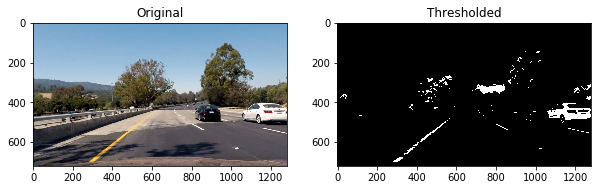

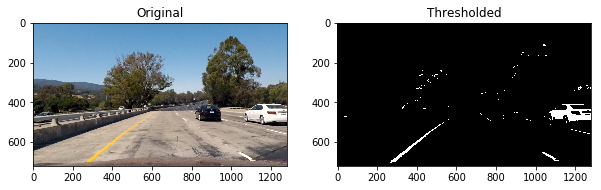

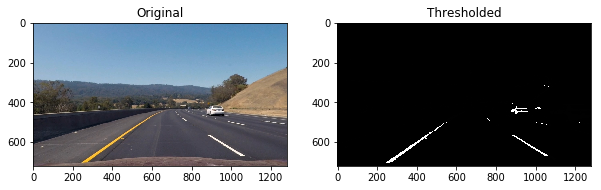

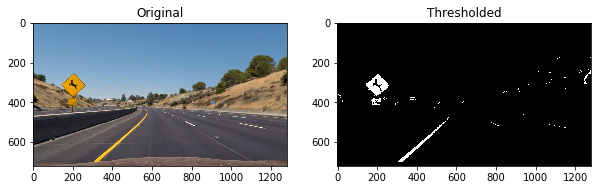

In [28]:
for file_name in glob.glob(test_images_glob):
    img = mpimg.imread(file_name)
    undist = undistort(img, camera_matrix)
    t = thresholding_filter(undist)
    f, ax = plt.subplots(1, 2, figsize=(10,8))
    ax[0].imshow(undist)
    ax[0].set_title('Original')
    ax[1].imshow(t, cmap = 'gray')
    ax[1].set_title('Thresholded')
    plt.show()

### Perspective transform

In [29]:
def get_source_points():
    return np.float32([ (300, 720), (1100, 720), (730, 480), (580, 480) ])

def get_destination_points():
    return np.float32([ (300, 720), (1100, 720), (1100, 0), (300, 0) ])

def perspective_transform() :
    return cv.getPerspectiveTransform(get_source_points(), get_destination_points())

def inverse_perspective_transform() :
    return cv.getPerspectiveTransform(get_destination_points(), get_source_points())

In [30]:
def warp_image(img):
    return cv.warpPerspective(img, perspective_transform(), (img.shape[1], img.shape[0]), flags=cv.INTER_LINEAR)

def inv_warp_image(img):
    return cv.warpPerspective(img, inverse_perspective_transform(), (img.shape[1], img.shape[0]), flags=cv.INTER_LINEAR)

<Figure size 432x288 with 0 Axes>

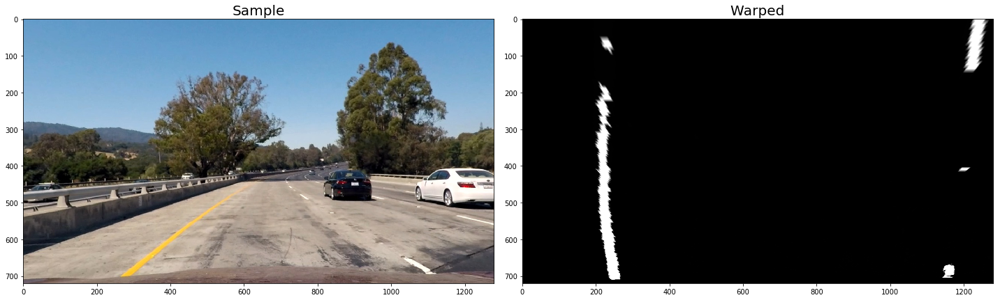

In [31]:
show_sample_fig([test_image, warp_image(thresholding_filter(test_image))], 
                ['Sample', 'Warped'],
                [None, 'gray'],
                name='warp_sample.png')


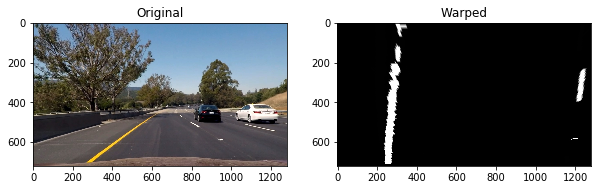

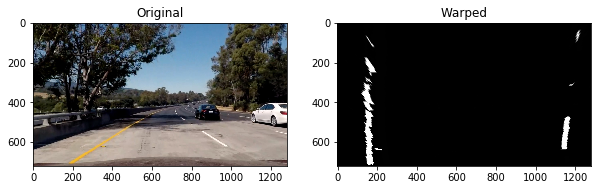

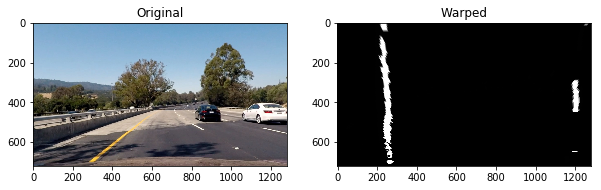

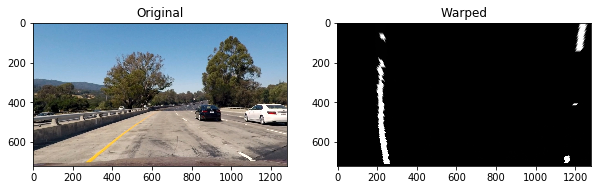

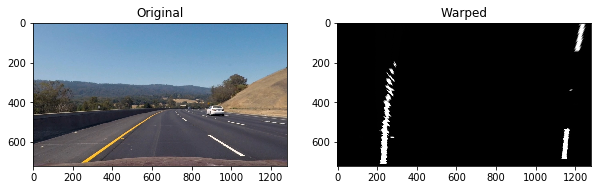

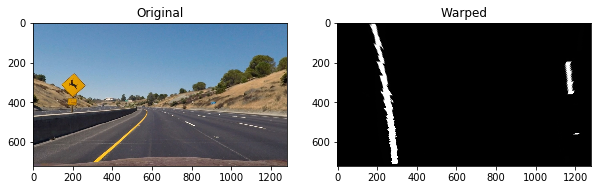

In [32]:
# warp all test images 
for file_name in glob.glob(test_images_glob):
    img = mpimg.imread(file_name)
    undist = undistort(img, camera_matrix)
    t = thresholding_filter(undist)
    w = warp_image(t)
    f, ax = plt.subplots(1, 2, figsize=(10,8))
    ax[0].imshow(undist)
    ax[0].set_title('Original')
    ax[1].imshow(w, cmap = 'gray')
    ax[1].set_title('Warped')
    plt.show()


### Detecting Lane Lines

In order to find and track the actual lane lanes we need to identify areas with a high count of white pixels.  
To do that we will use a histogram to bin the pixels into columns and look for peaks in the distribution.

In [33]:
def get_histogram(img) :
    return np.sum(w, axis=0)

linspace_y = lambda img: np.linspace(0, img.shape[0] - 1, img.shape[0] )

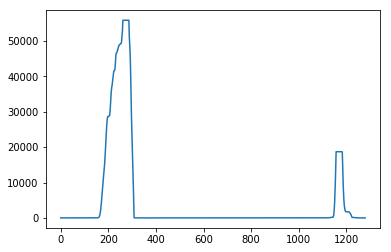

In [34]:
def draw_save_lane_histogram(image):
    medianfilt_kernel_size=51
    t = thresholding_filter(test_image)
    w = warp_image(t)
    histogram = get_histogram(w)
    histogram = signal.medfilt(histogram, medianfilt_kernel_size)
    plt.figure()
    plt.plot(histogram)
    hist_path = os.path.join(saved_img_path, 'lane_histogram.png')
    plt.savefig(hist_path)
    
draw_save_lane_histogram(test_image)    

In [35]:
class LanePoints:
    """Find left and right lines points"""
    def __init__(self, left, right):
        self.left = left
        self.right = right
    
    # 
    @staticmethod
    def reject_outlier(arr, avg):
        """ Function to reject the point outliers by comparing to frame max  """
        outlier_coef = 200
        return arr[abs(arr[:,0] - np.median(arr[:,0])) < outlier_coef]
    
    @staticmethod
    def get_center(img):
        """ Get center of image"""
        return int(img.shape[1]/2)
    
    @staticmethod
    def get_ind(arr):
        """ Get x point for a line """
        arr[ arr < 50] = 0  # remove anomalies
        nonzero = arr.nonzero()
        if nonzero[0].size > 0:
            return np.average(nonzero[0], weights=arr[nonzero]) # use weighed average as a x coordinate
        else:
            return 0
    
    @staticmethod
    def build(img):
        step = 40
        medianfilt_kernel_size=51
        left = np.empty((0,2))
        right = np.empty((0,2))
        center = LanePoints.get_center(img)
        
        histogram = np.sum(img, axis = 0)
        left_max = np.argmax(histogram[0:center])  # left max
        right_max = np.argmax(histogram[center:img.shape[1]]) + center # right max
        
        for i in range(img.shape[1] - step, -step, -step):
            histogram = np.sum(img[i:i + step,:], axis = 0)
            histogram = signal.medfilt(histogram, medianfilt_kernel_size)
            left_ind = LanePoints.get_ind(histogram[0:center])
            if left_ind > 0:
                left = np.vstack((left, [left_ind, int((i + i + step) / 2)]))
            
            right_ind = LanePoints.get_ind(histogram[center:img.shape[1]])
            if right_ind > 0:
                right = np.vstack((right, [right_ind+center, int((i + i + step) / 2)]))    
                
        return LanePoints(LanePoints.reject_outlier(left, left_max), LanePoints.reject_outlier(right, right_max))
        

In [36]:
# Define conversions in x and y from pixels space to meters
# THIS RATE CAN CHANGE GIVEN THE RESOLUTION OF THE CAMERA
# MUST BE CHANGED IF USING DIFFERENT SIZE IMAGES
PixelConversion = collections.namedtuple('PixelConversion', ['x_coef', 'y_coef'])
meter_to_pixel = PixelConversion(x_coef = 3.7/700,  y_coef=30/720)

In [41]:
class Line:
    """ Line calculation """
    def __init__(self, x, y, x_fit, y_ext, curve_radius):
        self.x = x
        self.y = y
        self.x_fit = x_fit
        self.y_ext = y_ext
        self.curve_radius = curve_radius
    
    @staticmethod
    def measure_curve_radius(x, y, img):
        y_max = img.shape[0]
        fit_curve = np.polyfit(y * meter_to_pixel.y_coef, x * meter_to_pixel.x_coef, 2)
        # curve_radius
        return ( (1 + (2 * fit_curve[0] * y_max + fit_curve[1])**2)**1.5) / np.absolute(2 * fit_curve[0])
    
    @staticmethod
    def build(points, img):
        x = points[:, 0]
        y = points[:, 1]
        fit = np.polyfit(y, x, 2)
        
        y_ext = np.hstack( (720, y, 0) )
        x_fit = fit[0] * y_ext**2 +  fit[1] * y_ext + fit[2]

        curve_radius = Line.measure_curve_radius(x, y, img)
        return Line(x, y, x_fit, y_ext, curve_radius)
    

#### Build Pipeline

In [42]:
class LaneDetector:
    """Pipeline class"""
    def __init__(self):
        self.left_pts = np.array(None)
        self.right_pts = np.array(None)
        self.left_curv = 1000
        self.right_curv = 1000
        self.pr_line = None
        self.pl_line = None
        self.font = cv.FONT_HERSHEY_SIMPLEX

    def print_deviation(self, img, left, right):
        """ Print diviation from the center on a frame"""
        middle = left.x_fit[0] + (right.x_fit[0] - left.x_fit[0]) / 2.0
        dev = (middle - 640) * meter_to_pixel.x_coef
        msg = 'Vehicle is %.2fm right of center' % dev if dev >= 0 else 'Vehicle is %.2fm left of center' % -dev
        cv.putText(img, msg, (50, 150), self.font, 1, (255, 255, 255), 3)
        
    def print_curve(self, img, left, right):
        """ Print curve radiuses on a frame """
        cv.putText(img, 'Left line curve: %dm' % left.curve_radius, (50, 50), self.font, 1, (255, 255, 255), 3)
        cv.putText(img, 'Right line curve: %dm' % right.curve_radius, (50, 100), self.font, 1, (255, 255, 255), 3)
        
    def create_image(self, img):
        """ Create an image to draw """
        blank = np.zeros_like(img).astype(np.uint8)
        return np.dstack((blank, blank, blank))
    
    def draw(self, pts_left, pts_right, blank_image, base_image):
        """ Draw lane on a frame"""
        pts = np.hstack((pts_left, pts_right))
        # draw lane
        cv.fillPoly(blank_image, np.int_([pts]), (0, 255, 0))
         # Warp the blank back to original image space using inverse perspective matrix
        inv_warp = inv_warp_image(blank_image)
        # merge with the original image and return
        return cv.addWeighted(base_image, 1, inv_warp, 0.3, 0)
        
    def find_lane(self, warped, base_image, state_fn):
        """ Find lines and draw lane """
        blank_image = self.create_image(warped)
        
        lane_points = LanePoints.build(warped)        
        left_line = Line.build(lane_points.left, warped)
        right_line = Line.build(lane_points.right, warped)

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_line.x_fit, left_line.y_ext]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.x_fit, right_line.y_ext])))])

        check_radius = lambda l1,l2: abs(l1.curve_radius - l2.curve_radius)
        
        if self.pl_line is None or check_radius(self.pl_line, left_line) < 3000:
            self.left_pts = pts_left
            self.pl_line = left_line
        else:
            pts_left = self.left_pts
            
        if self.pr_line is None or check_radius(self.pr_line, right_line) < 3000:
            self.right_pts = pts_right
            self.pr_line = right_line
        else:
            pts_right = self.right_pts    
            
        result = self.draw(self.left_pts, self.right_pts, blank_image, base_image)
            
        self.print_curve(result, self.pl_line, self.pr_line)
        
        self.print_deviation(result, self.pl_line, self.pr_line)
        
        # for analysis purposes
        if state_fn:
            state_fn(left_line, right_line)
            
        return result

    def detect(self, img, state_fn=None):
        """ Pipeline for lane detection """
        undist = undistort(img, camera_matrix)
        filtered = thresholding_filter(undist)
        warped = warp_image(filtered)
        result = self.find_lane(warped, undist, state_fn)
        return result

Check how it builds a lane for every test image 

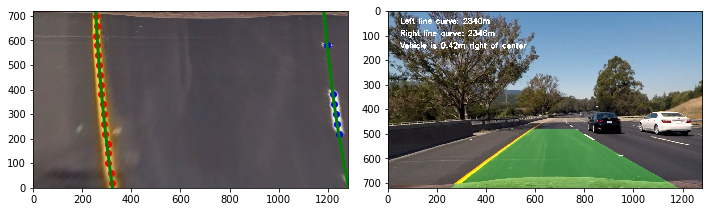

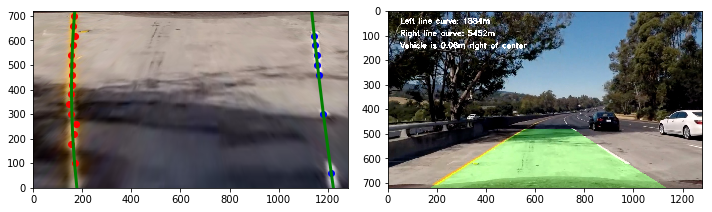

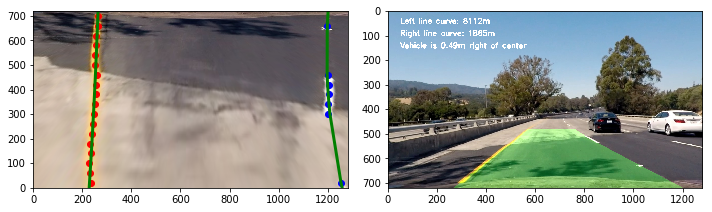

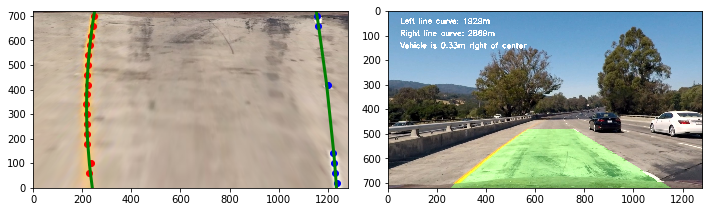

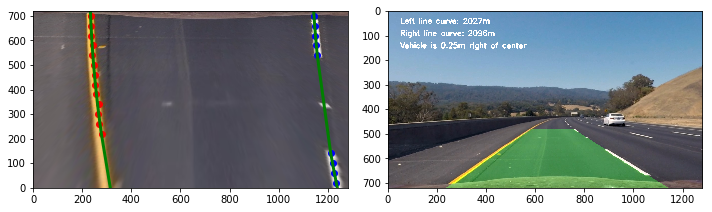

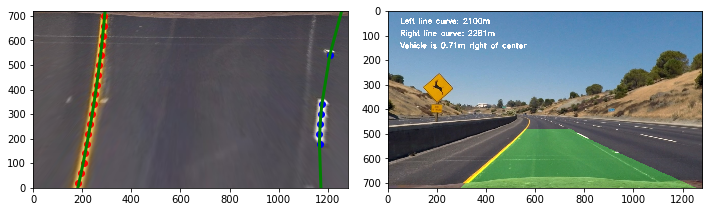

In [43]:
# Grab all the test images
test_imgs = glob.glob(os.path.join('test_images/', 'test*.jpg'))
for fname in test_imgs:
    ld = LaneDetector()
    # Get the original image
    img = cv.cvtColor(cv.imread(fname), cv.COLOR_BGR2RGB)
    
    # undistort, thresholdin, warp
    undist = undistort(img, camera_matrix)
    filtered = thresholding_filter(undist)
    
    orig_undist = warp_image(undist)
    transformed = warp_image(filtered)
    
    left_line = None
    right_line = None
    def fn(ll, rl):
        global left_line
        global right_line
        left_line = ll
        right_line = rl

    result = ld.find_lane(transformed, undist, fn)
    
    f, ax = plt.subplots(1, 2, figsize=(10,8))
    f.tight_layout()
    ax[0].imshow(orig_undist)
    ax[0].scatter(left_line.x, left_line.y, c = 'r')
    ax[0].scatter(right_line.x, right_line.y, c = 'b')
    ax[0].plot(left_line.x_fit, left_line.y_ext, color='green', linewidth=3)
    ax[0].plot(right_line.x_fit, right_line.y_ext, color='green', linewidth=3)
    ax[0].set_xlim([0, 1280])
    ax[0].set_ylim([0, 720])
    ax[1].imshow(result)
    fp, fn = os.path.split(fname)
    tpath = os.path.join(tracking_path, fn) 
    plt.tight_layout()
    plt.savefig(tpath)
    plt.show()

Draw on test images

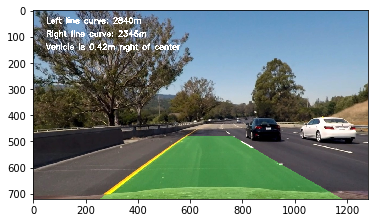

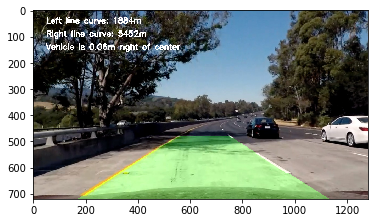

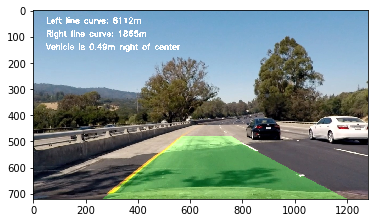

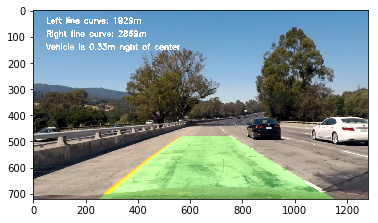

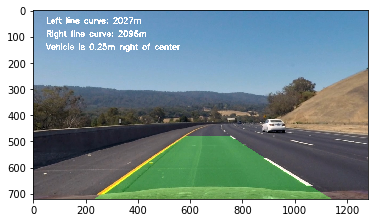

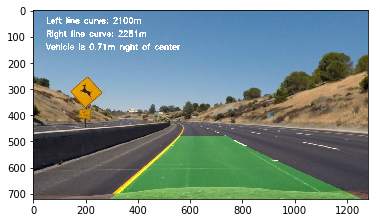

In [44]:
# Grab all the test images
test_imgs = glob.glob(os.path.join('test_images/', 'test*.jpg'))
for fname in test_imgs:
    ld = LaneDetector()
    img = cv.cvtColor(cv.imread(fname), cv.COLOR_BGR2RGB)
    result = ld.detect(img)
    plt.figure()
    plt.imshow(result)
    plt.show()

Draw on video

In [45]:
detector = LaneDetector()
clip = VideoFileClip(sample_video)
out = clip.fl_image(detector.detect)
out.write_videofile(processed_video, audio=False, verbose=False)
print('Done.')

100%|█████████▉| 1260/1261 [05:44<00:00,  3.66it/s]


Done.


In [46]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(processed_video))